# Conservación del área según el paso de integración

Se construyen de forma independiente `Potential` y `TrajectoryGC`, se componen en `System` y se transporta el mismo contorno cuadrado con `System.simulate`. Se compara, en una sola figura, el error relativo del área para `step = 0.01`, `0.005` y `0.0025`.

In [8]:
import matplotlib.pyplot as plt
import numpy as np

from classes import GridPotential, SystemResearch, TrajectoryGC, create_system
from config_logging import configure_logging
from workflows.potentials import mock_potential

from IPython.display import HTML

configure_logging()

potential: GridPotential = mock_potential(
    A=0.7, M=25, nx=64, ny=64, seed=27, k=5,
)
trajectory = TrajectoryGC(rho=0.3, eta=0.0)
system = create_system(potential, trajectory)
research = SystemResearch(system)

2026-07-17 14:11:40 | INFO     | MainProcess | workflows.potentials | Generating mock potential: A=0.7 M=25 grid=64x64 seed=27 interpolation_order=5
2026-07-17 14:11:40 | INFO     | MainProcess | workflows.potentials | Mock potential ready: modes=1 spatial_period=6.28319


In [9]:
# Igual que en view_area_conservatios: cuadrado 1x1 con el vértice
# inferior izquierdo en el centro y 20 puntos por lado.
z0_square = research.guiding_center_square_initial_conditions(
    side=1.0,
    points_per_side=20,
)

steps = (0.01, 0.005, 0.0025)
t_span = (0.0, 6 * np.pi)
n_save_step = 361

In [10]:
solutions = {}
areas = {}
relative_errors = {}

for integration_step in steps:
    solution = system.simulate(
        z0_square,
        step=integration_step,
        t_span=t_span,
        n_save_step=n_save_step,
        method='BM4',
        check_energy=False,
        progress=True,
    )
    area = research.guiding_center_polygon_area(solution)
    relative_error = (area - area[0]) / abs(area[0])

    solutions[integration_step] = solution
    areas[integration_step] = area
    relative_errors[integration_step] = relative_error

print(f"{'step':>10} {'n_steps':>12} {'max |error rel.|':>20} {'error rel. final':>20}")
for integration_step in steps:
    error = relative_errors[integration_step]
    solution = solutions[integration_step]
    print(
        f"{integration_step:10.4g} {solution.n_steps:12d} "
        f"{np.max(np.abs(error)):20.8e} {error[-1]:20.8e}"
    )

solve_extended [==============================] 100.0% (2160/2160 steps, t=18.8496)
solve_extended [==============================] 100.0% (3960/3960 steps, t=18.8496)
solve_extended [==============================] 100.0% (7560/7560 steps, t=18.8496)


      step      n_steps     max |error rel.|     error rel. final
      0.01         2160       1.12661668e-02       1.40978985e-03
     0.005         3960       1.12661668e-02       1.40978984e-03
    0.0025         7560       1.12661668e-02       1.40978984e-03


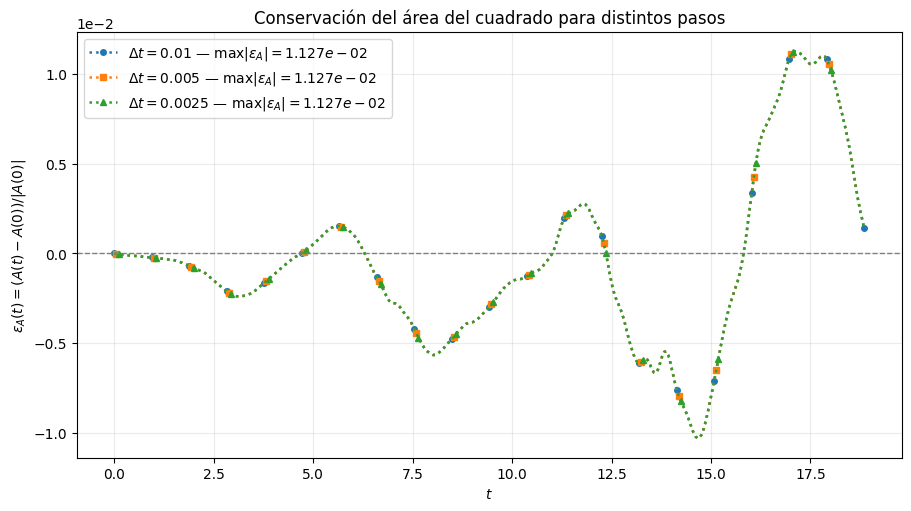

In [11]:
fig, ax = plt.subplots(figsize=(9, 5), constrained_layout=True)

markers = ('o', 's', '^', 'D')
for index, integration_step in enumerate(steps):
    solution = solutions[integration_step]
    error = relative_errors[integration_step]
    max_error = np.max(np.abs(error))
    ax.plot(
        solution.t,
        error,
        label=(
            fr'$\Delta t={integration_step:g}$'
            fr' — $\max|\varepsilon_A|={max_error:.3e}$'
        ),
        ls=':',
        lw=1.8,
        marker=markers[index % len(markers)],
        markevery=(index, max(1, len(solution.t) // 20)),
        markersize=4,
    )

ax.axhline(0.0, color='0.5', ls='--', lw=1)
ax.set(
    xlabel='$t$',
    ylabel=r'$\varepsilon_A(t)=(A(t)-A(0))/|A(0)|$',
    title='Conservación del área del cuadrado para distintos pasos',
)
ax.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
ax.grid(alpha=0.25)
ax.legend()
plt.show()

## Repetición con 40 puntos por lado

Se repite el experimento con 40 puntos por lado: 160 trayectorias en total.

In [12]:
z0_square_160 = research.guiding_center_square_initial_conditions(
    side=1.0,
    points_per_side=40,
)

solutions_160 = {}
relative_errors_160 = {}

for integration_step in steps:
    solution = system.simulate(
        z0_square_160,
        step=integration_step,
        t_span=t_span,
        n_save_step=n_save_step,
        method='BM4',
        check_energy=False,
        progress=True,
    )
    area = research.guiding_center_polygon_area(solution)
    relative_error = (area - area[0]) / abs(area[0])

    solutions_160[integration_step] = solution
    relative_errors_160[integration_step] = relative_error

print(f"{'step':>10} {'n_steps':>12} {'max |error rel.|':>20} {'error rel. final':>20}")
for integration_step in steps:
    error = relative_errors_160[integration_step]
    solution = solutions_160[integration_step]
    print(
        f"{integration_step:10.4g} {solution.n_steps:12d} "
        f"{np.max(np.abs(error)):20.8e} {error[-1]:20.8e}"
    )

solve_extended [==============================] 100.0% (2160/2160 steps, t=18.8496)
solve_extended [==============================] 100.0% (3960/3960 steps, t=18.8496)
solve_extended [==============================] 100.0% (7560/7560 steps, t=18.8496)


      step      n_steps     max |error rel.|     error rel. final
      0.01         2160       2.63293094e-03      -2.42510608e-04
     0.005         3960       2.63293094e-03      -2.42510608e-04
    0.0025         7560       2.63293094e-03      -2.42510610e-04


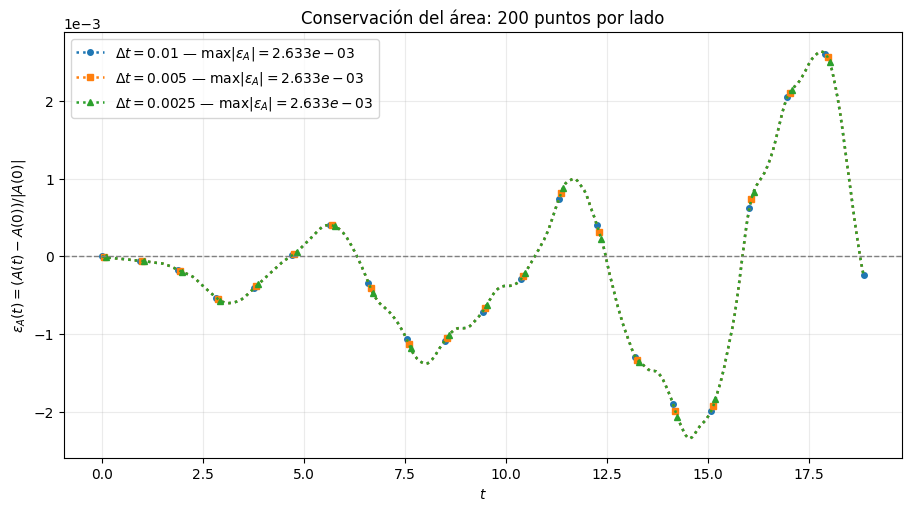

In [13]:
fig, ax = plt.subplots(figsize=(9, 5), constrained_layout=True)

markers = ('o', 's', '^', 'D')
for index, integration_step in enumerate(steps):
    solution = solutions_160[integration_step]
    error = relative_errors_160[integration_step]
    max_error = np.max(np.abs(error))
    ax.plot(
        solution.t,
        error,
        label=(
            fr'$\Delta t={integration_step:g}$'
            fr' — $\max|\varepsilon_A|={max_error:.3e}$'
        ),
        ls=':',
        lw=1.8,
        marker=markers[index % len(markers)],
        markevery=(index, max(1, len(solution.t) // 20)),
        markersize=4,
    )

ax.axhline(0.0, color='0.5', ls='--', lw=1)
ax.set(
    xlabel='$t$',
    ylabel=r'$\varepsilon_A(t)=(A(t)-A(0))/|A(0)|$',
    title='Conservación del área: 40 puntos por lado',
)
ax.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
ax.grid(alpha=0.25)
ax.legend()
plt.show()

In [14]:
square_animation = research.animate_electric_psi_area_conservation(
    solution,
    # 61 frames (incluido el final): evita que la representación HTML supere
    # el límite de Matplotlib y descarte los instantes posteriores a 2*pi.
    frame_stride=6,
    step=2,
)
HTML(square_animation.to_jshtml())

2026-07-17 14:13:59 | INFO     | MainProcess | classes.system.research | GC area-conservation animation ready: trajectories=(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159) frames=61 initial_area=1 max_relative_error=0.00263293
2026-07-17 14:13:59 | INFO     | MainProcess | matplotlib.animation | Animation.save using <class 'matplotlib.animation.HTMLWriter